In [1]:
!pip install -q captum

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.2/455.2 kB 3.2 MB/s eta 0:00:0000:0100:01


In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F

from PIL import Image

import albumentations as A
from albumentations.pytorch import ToTensorV2

from captum.attr import IntegratedGradients

print("Torch:", torch.__version__)
print("CUDA:", torch.cuda.is_available())

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Torch: 2.10.0+cu128
CUDA: True
Device: cuda


In [ ]:
import pandas as pd

MM_ROOT = "/kaggle/input/datasets/subihanbiswas/multimodal-closedset-unified"

# -----------------------------
# Iris CSVs
# -----------------------------

iris_train = pd.read_csv(
    f"{MM_ROOT}/iris/train.csv"
)

iris_val = pd.read_csv(
    f"{MM_ROOT}/iris/val.csv"
)

iris_test = pd.read_csv(
    f"{MM_ROOT}/iris/test.csv"
)

print("Train :", len(iris_train))
print("Val   :", len(iris_val))
print("Test  :", len(iris_test))

Train : 1428
Val   : 204
Test  : 408


In [4]:
from torchvision import transforms

# ==========================================
# Iris Test Transform
# ==========================================

iris_test_transform = transforms.Compose([

    transforms.Resize((224,224)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485,0.456,0.406],
        std=[0.229,0.224,0.225]
    )

])

In [5]:
print(iris_test.columns.tolist())

['modality_type', 'image_path', 'multimodal_id', 'subject_id', 'eye', 'split']


In [6]:
from torch.utils.data import Dataset
from PIL import Image
import torch
import os


class IrisDataset(Dataset):

    def __init__(
        self,
        dataframe,
        root_dir,
        transform=None
    ):

        self.df = dataframe.reset_index(drop=True)

        self.root_dir = root_dir

        self.transform = transform

    def __len__(self):

        return len(self.df)

    def __getitem__(self, idx):

        row = self.df.iloc[idx]

        image_path = os.path.join(
            self.root_dir,
            row["image_path"]
        )

        image = Image.open(
            image_path
        ).convert("RGB")

        if self.transform:

            image = self.transform(image)

        label = torch.tensor(
            row["multimodal_id"],
            dtype=torch.long
        )

        return {

            "image": image,

            "label": label,

            "path": image_path

        } 

In [7]:
IRIS_ROOT = "/kaggle/input/datasets/subihanbiswas/iitd-iris-dataset/IITD_database"

In [8]:
print(MM_ROOT)

print(iris_test.iloc[0]["image_path"])

print(os.path.exists(
    os.path.join(IRIS_ROOT, iris_test.iloc[0]["image_path"])
))

/kaggle/input/datasets/subihanbiswas/multimodal-closedset-unified
001/04_L.bmp
True


In [9]:
import os

print(os.path.exists(
    "/kaggle/input/datasets/subihanbiswas/iitd-iris-dataset/IITD_database/001/04_L.bmp"
))

print(os.path.exists(
    "/kaggle/input/datasets/subihanbiswas/iitd-iris-dataset/IITD_database/135/04_L.bmp"
))

True
True


In [10]:
import os

for root, dirs, files in os.walk("/kaggle/input"):
    if "04_L.bmp" in files:
        print(root)
        print(os.path.join(root, "04_L.bmp"))
        break

/kaggle/input/datasets/subihanbiswas/iitd-iris-dataset/IITD_database/135
/kaggle/input/datasets/subihanbiswas/iitd-iris-dataset/IITD_database/135/04_L.bmp


In [11]:
print(iris_test[["image_path", "subject_id", "multimodal_id"]].head(20))

      image_path  subject_id  multimodal_id
0   001/04_L.bmp           1              0
1   001/07_R.bmp           1              0
2   002/04_L.bmp           2              1
3   002/07_R.bmp           2              1
4   003/04_L.bmp           3              2
5   003/07_R.bmp           3              2
6   004/04_L.bmp           4              3
7   004/07_R.bmp           4              3
8   005/04_L.bmp           5              4
9   005/07_R.bmp           5              4
10  006/04_L.bmp           6              5
11  006/07_R.bmp           6              5
12  007/04_L.bmp           7              6
13  007/07_R.bmp           7              6
14  008/04_L.bmp           8              7
15  008/07_R.bmp           8              7
16  009/04_L.bmp           9              8
17  009/07_R.bmp           9              8
18  010/04_L.bmp          10              9
19  010/07_R.bmp          10              9


In [12]:
import os

print(os.listdir("/kaggle/input/datasets/subihanbiswas/iitd-iris-dataset/IITD_database")[:20])

['135', '183', '057', '086', '199', '121', '061', '192', '048', '053', '164', '147', '145', '213', '051', '137', '095', '018', '044', '016']


In [13]:
print(iris_test.iloc[0]["image_path"])

001/04_L.bmp


In [14]:
iris_test_dataset = IrisDataset(

    dataframe=iris_test,

    root_dir=IRIS_ROOT,

    transform=iris_test_transform

)

print("Test Images :", len(iris_test_dataset))

Test Images : 408


In [15]:
from torch.utils.data import DataLoader

iris_test_loader = DataLoader(

    iris_test_dataset,

    batch_size=32,

    shuffle=False,

    num_workers=2,

    pin_memory=True

)

In [16]:
batch = next(iter(iris_test_loader))

print(batch["image"].shape)

print(batch["label"].shape)

print(batch["path"][:3])

torch.Size([32, 3, 224, 224])
torch.Size([32])
['/kaggle/input/datasets/subihanbiswas/iitd-iris-dataset/IITD_database/001/04_L.bmp', '/kaggle/input/datasets/subihanbiswas/iitd-iris-dataset/IITD_database/001/07_R.bmp', '/kaggle/input/datasets/subihanbiswas/iitd-iris-dataset/IITD_database/002/04_L.bmp']


In [17]:
import timm
import torch
import torch.nn as nn
import torch.nn.functional as F

convnext = timm.create_model(
    "convnextv2_tiny.fcmae_ft_in22k_in1k",
    pretrained=False,
    num_classes=0
)


class IrisConvNextV2(nn.Module):

    def __init__(self, backbone, num_classes=204):

        super().__init__()

        self.backbone = backbone

        self.embedding_head = nn.Sequential(

            nn.Linear(768,1024),
            nn.BatchNorm1d(1024),
            nn.GELU(),
            nn.Dropout(0.5),

            nn.Linear(1024,512),
            nn.BatchNorm1d(512),
            nn.GELU(),
            nn.Dropout(0.3)

        )

        self.classifier = nn.Linear(
            512,
            num_classes
        )

    def forward(self,x):

        features = self.backbone(x)

        embedding = self.embedding_head(features)

        logits = self.classifier(embedding)

        normalized_embedding = F.normalize(
            embedding,
            p=2,
            dim=1
        )

        return logits, normalized_embedding

In [18]:
device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

iris_model = IrisConvNextV2(
    backbone=convnext,
    num_classes=204
)

ckpt = torch.load(
    "/kaggle/input/models/subihanbiswas/unimodal-best/pytorch/default/2/iitd-iris-closedset-model_new.pth",
    map_location=device
)

iris_model.load_state_dict(ckpt)

iris_model.to(device)

iris_model.eval()

print("Model Loaded")

Model Loaded


In [19]:
class IrisWrapper(nn.Module):

    def __init__(self, model):

        super().__init__()

        self.model = model

    def forward(self,x):

        logits,_ = self.model(x)

        return logits


wrapper = IrisWrapper(
    iris_model
)

wrapper.eval()

IrisWrapper(
  (model): IrisConvNextV2(
    (backbone): ConvNeXt(
      (stem): Sequential(
        (0): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
        (1): LayerNorm2d((96,), eps=1e-06, elementwise_affine=True)
      )
      (stages): Sequential(
        (0): ConvNeXtStage(
          (downsample): Identity()
          (blocks): Sequential(
            (0): ConvNeXtBlock(
              (conv_dw): Conv2d(96, 96, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=96)
              (norm): LayerNorm((96,), eps=1e-06, elementwise_affine=True)
              (mlp): GlobalResponseNormMlp(
                (fc1): Linear(in_features=96, out_features=384, bias=True)
                (act): GELU()
                (drop1): Dropout(p=0.0, inplace=False)
                (grn): GlobalResponseNorm()
                (fc2): Linear(in_features=384, out_features=96, bias=True)
                (drop2): Dropout(p=0.0, inplace=False)
              )
              (shortcut): Identity()
       

In [20]:
from tqdm.auto import tqdm
import pandas as pd

prediction_results = []

iris_model.eval()

with torch.no_grad():

    for batch in tqdm(iris_test_loader):

        images = batch["image"].to(device)
        labels = batch["label"].to(device)

        logits, _ = iris_model(images)

        probs = torch.softmax(logits, dim=1)

        confidence, prediction = probs.max(dim=1)

        for i in range(len(images)):

            prediction_results.append({

                "path": batch["path"][i],

                "ground_truth": labels[i].item(),

                "prediction": prediction[i].item(),

                "confidence": confidence[i].item(),

                "correct": prediction[i].item() == labels[i].item()

            })

  0%|          | 0/13 [00:00<?, ?it/s]

In [21]:
results_df = pd.DataFrame(prediction_results)

results_df.head()

,path,ground_truth,prediction,confidence,correct
0,/kaggle/input/datasets/subihanbiswas/iitd-iris...,0,0,0.080351,True
1,/kaggle/input/datasets/subihanbiswas/iitd-iris...,0,0,0.123131,True
2,/kaggle/input/datasets/subihanbiswas/iitd-iris...,1,1,0.022700,True
3,/kaggle/input/datasets/subihanbiswas/iitd-iris...,1,1,0.042023,True
4,/kaggle/input/datasets/subihanbiswas/iitd-iris...,2,2,0.384602,True


In [22]:
accuracy = results_df["correct"].mean() * 100

print(f"Test Accuracy : {accuracy:.2f}%")

Test Accuracy : 99.26%


In [23]:
results_df.to_csv(
    "iris_predictions.csv",
    index=False
)

print("Prediction table saved!")

Prediction table saved!


In [24]:
results_df["confidence"].describe()

count    408.000000
mean       0.131220
std        0.130970
min        0.010445
25%        0.035241
50%        0.073574
75%        0.188332
max        0.747249
Name: confidence, dtype: float64

In [25]:
high_conf = results_df.sort_values(
    "confidence",
    ascending=False
)

high_conf.head(5)

,path,ground_truth,prediction,confidence,correct
9,/kaggle/input/datasets/subihanbiswas/iitd-iris...,4,4,0.747249,True
38,/kaggle/input/datasets/subihanbiswas/iitd-iris...,19,19,0.704524,True
8,/kaggle/input/datasets/subihanbiswas/iitd-iris...,4,4,0.663536,True
39,/kaggle/input/datasets/subihanbiswas/iitd-iris...,19,19,0.606787,True
403,/kaggle/input/datasets/subihanbiswas/iitd-iris...,201,201,0.562085,True


In [26]:
medium_conf = results_df.iloc[
    (
        results_df["confidence"] - results_df["confidence"].median()
    ).abs().argsort()
]

medium_conf.head(5)

,path,ground_truth,prediction,confidence,correct
397,/kaggle/input/datasets/subihanbiswas/iitd-iris...,198,198,0.073709,True
186,/kaggle/input/datasets/subihanbiswas/iitd-iris...,93,93,0.073438,True
272,/kaggle/input/datasets/subihanbiswas/iitd-iris...,136,136,0.072704,True
322,/kaggle/input/datasets/subihanbiswas/iitd-iris...,161,161,0.072299,True
311,/kaggle/input/datasets/subihanbiswas/iitd-iris...,155,155,0.072005,True


In [27]:
low_conf = results_df.sort_values(
    "confidence"
)

low_conf.head(5)

,path,ground_truth,prediction,confidence,correct
326,/kaggle/input/datasets/subihanbiswas/iitd-iris...,163,161,0.010445,False
24,/kaggle/input/datasets/subihanbiswas/iitd-iris...,12,110,0.011470,False
64,/kaggle/input/datasets/subihanbiswas/iitd-iris...,32,32,0.013437,True
354,/kaggle/input/datasets/subihanbiswas/iitd-iris...,177,177,0.013734,True
346,/kaggle/input/datasets/subihanbiswas/iitd-iris...,173,173,0.014085,True


In [28]:
import numpy as np
import matplotlib.pyplot as plt

from captum.attr import IntegratedGradients

In [29]:
imagenet_mean = np.array([
    0.485,
    0.456,
    0.406
])

imagenet_std = np.array([
    0.229,
    0.224,
    0.225
])


def denormalize(image):

    image = image * imagenet_std + imagenet_mean

    image = np.clip(image,0,1)

    return image

In [30]:
def normalize_attribution(attr):

    attr = np.abs(attr)

    attr = attr / (attr.max() + 1e-8)

    return attr

In [31]:
from PIL import Image
import numpy as np

def load_iris_image(path, transform):

    image = Image.open(path).convert("RGB")

    # transformed tensor
    tensor = transform(image)

    # use transformed image for visualization
    original = tensor.permute(1,2,0).cpu().numpy()

    original = denormalize(original)

    original = (original * 255).astype(np.uint8)

    return original, tensor

In [32]:
def generate_integrated_gradients(
    sample_info,
    model,
    transform,
    device,
    explain="prediction",
    n_steps=50
):

    original, tensor = load_iris_image(
        sample_info["path"],
        transform
    )

    input_tensor = tensor.unsqueeze(0).to(device)

    input_tensor.requires_grad_(True)

    logits = model(input_tensor)

    probabilities = torch.softmax(
        logits,
        dim=1
    )

    prediction = probabilities.argmax(dim=1).item()

    confidence = probabilities.max().item()

    if explain == "prediction":

        target_class = prediction

    else:

        target_class = sample_info["ground_truth"]

    ig = IntegratedGradients(model)

    attr = ig.attribute(

        input_tensor,

        target=target_class,

        n_steps=n_steps

    )

    attr = (
        attr.squeeze()
        .detach()
        .cpu()
        .numpy()
    )

    attr = np.mean(
        np.abs(attr),
        axis=0
    )

    attr = normalize_attribution(attr)

    return {

        "original_image": original,

        "input_tensor": input_tensor,

        "attribution": attr,

        "prediction": prediction,

        "ground_truth": sample_info["ground_truth"],

        "confidence": confidence,

        "target_class": target_class,

        "path": sample_info["path"]

    }

In [33]:
def plot_integrated_gradients(
    result,
    alpha=0.45,
    cmap="jet"
):

    original = result["original_image"]

    heatmap = result["attribution"]

    original = result["original_image"].astype(np.float32) / 255.0 

    overlay = (
        alpha * plt.cm.get_cmap(cmap)(heatmap)[...,:3]
        +
        (1-alpha) * original
    )

    fig, ax = plt.subplots(
        1,
        3,
        figsize=(15,5)
    )

    ax[0].imshow(original)
    ax[0].set_title("Original")
    ax[0].axis("off")

    ax[1].imshow(
        heatmap,
        cmap=cmap
    )
    ax[1].set_title("Integrated Gradients")
    ax[1].axis("off")

    ax[2].imshow(overlay)

    ax[2].set_title(
        f"Overlay\nGT:{result['ground_truth']} Pred:{result['prediction']}\nConfidence:{result['confidence']:.4f}"
    )

    ax[2].axis("off")

    return fig

In [34]:
sample = high_conf.iloc[0]

result = generate_integrated_gradients(

    sample_info=sample,

    model=wrapper,

    transform=iris_test_transform,

    device=device,

    explain="prediction",

    n_steps=50

)

/tmp/ipykernel_58/4223881066.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  alpha * plt.cm.get_cmap(cmap)(heatmap)[...,:3]


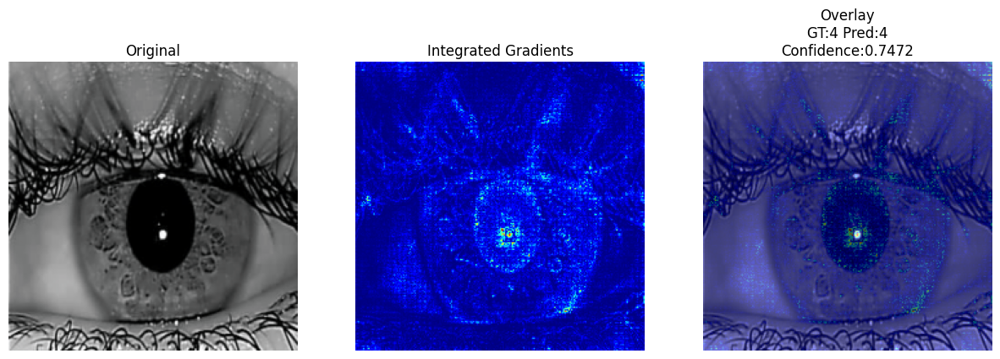

In [35]:
fig = plot_integrated_gradients(result)

plt.show()

/tmp/ipykernel_58/4223881066.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  alpha * plt.cm.get_cmap(cmap)(heatmap)[...,:3]


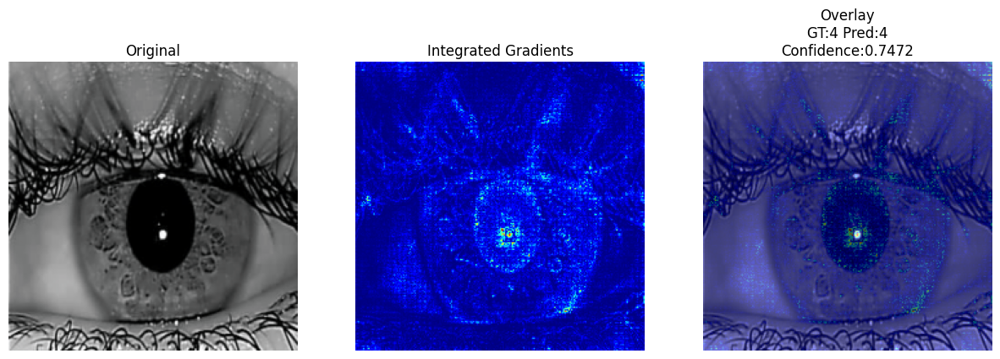

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.000000011920929].


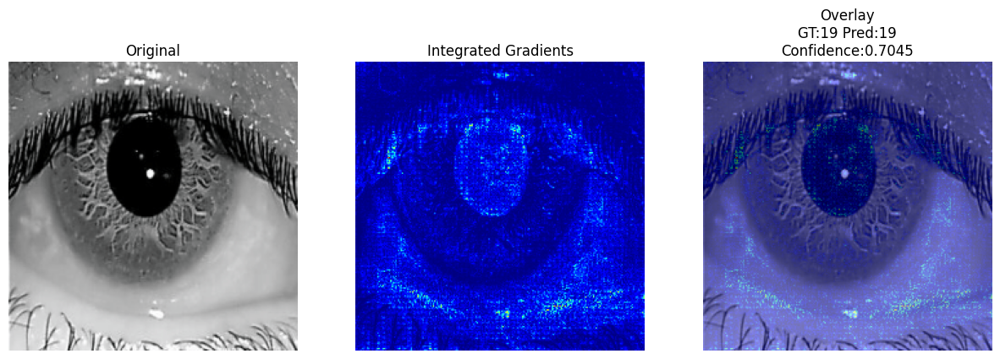

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.000000011920929].


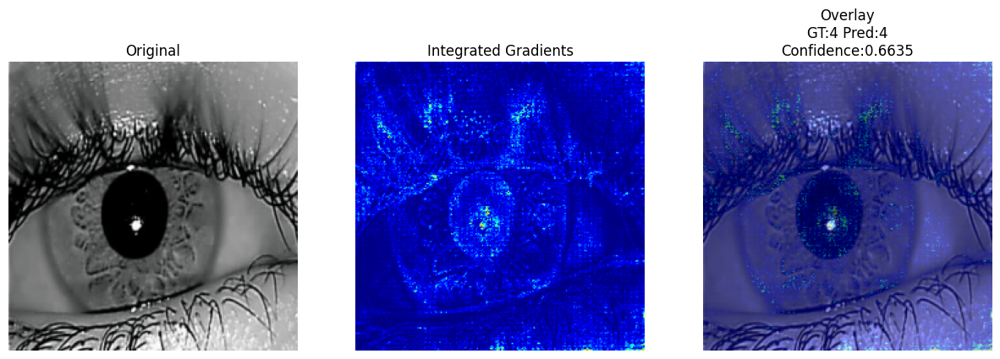

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.000000011920929].


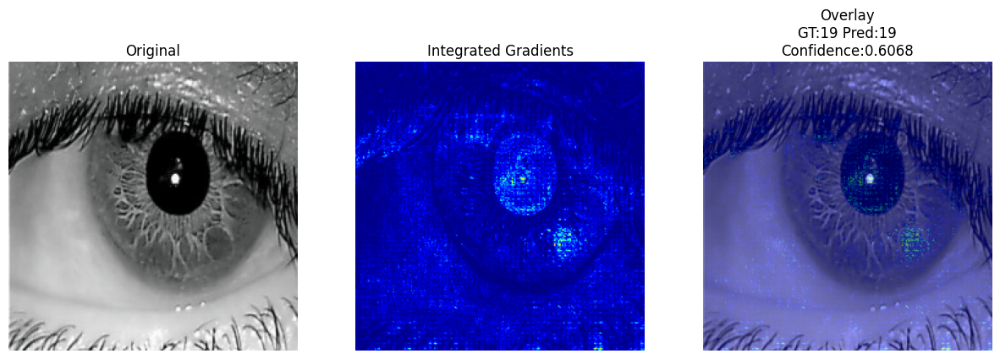

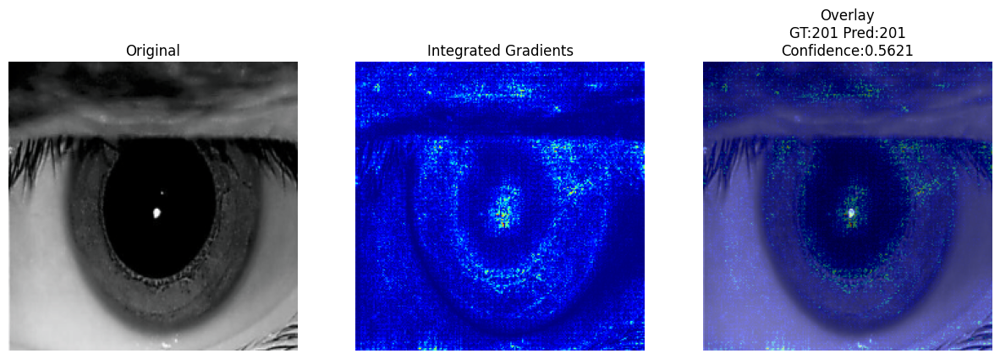

In [36]:
for i in range(5):
    sample = high_conf.iloc[i]

    result = generate_integrated_gradients(
        sample_info=sample,
        model=wrapper,
        transform=iris_test_transform ,
        device=device,
        explain="prediction"
    )

    fig = plot_integrated_gradients(result)
    plt.show()

/tmp/ipykernel_58/4223881066.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  alpha * plt.cm.get_cmap(cmap)(heatmap)[...,:3]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.000000011920929].


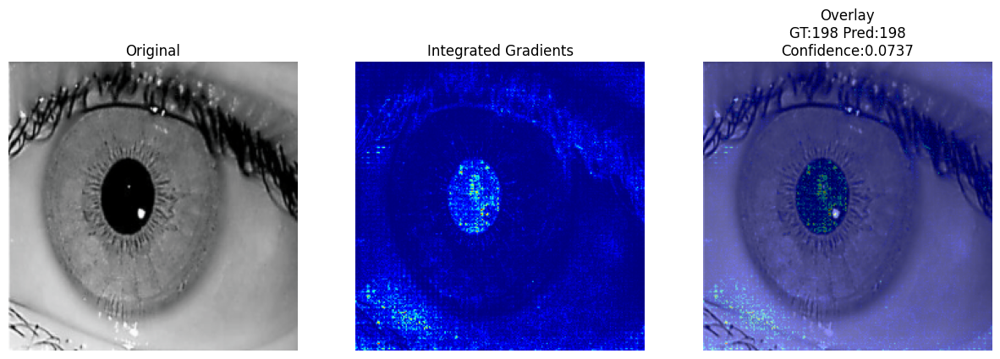

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.000000011920929].


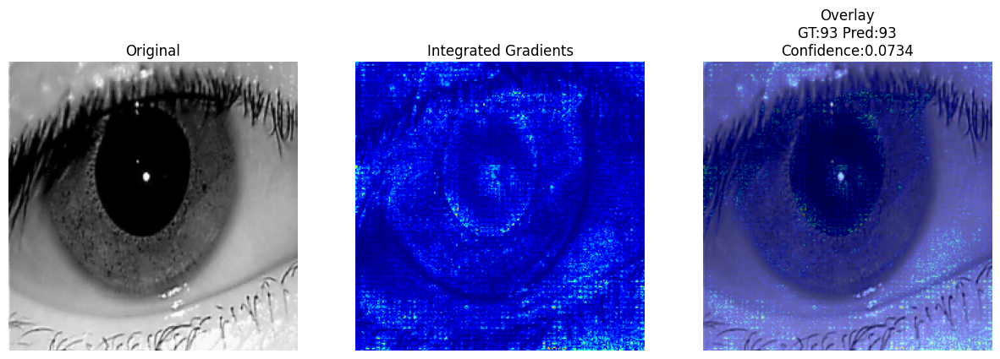

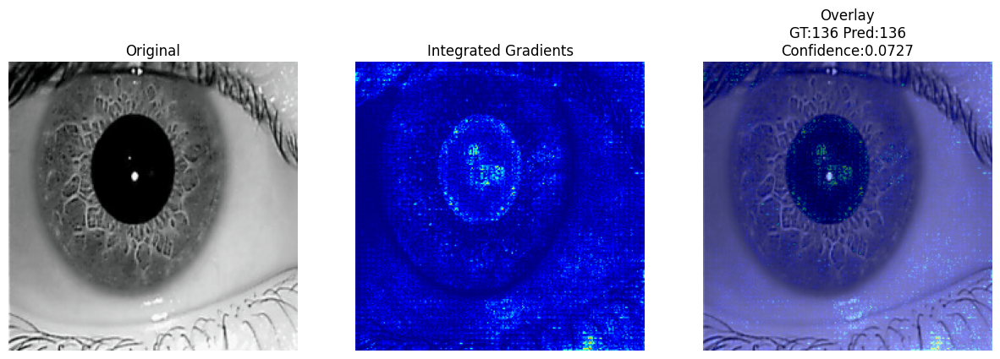

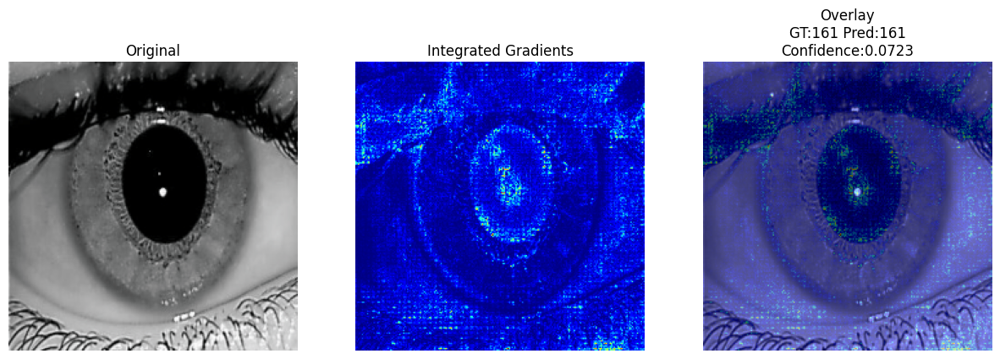

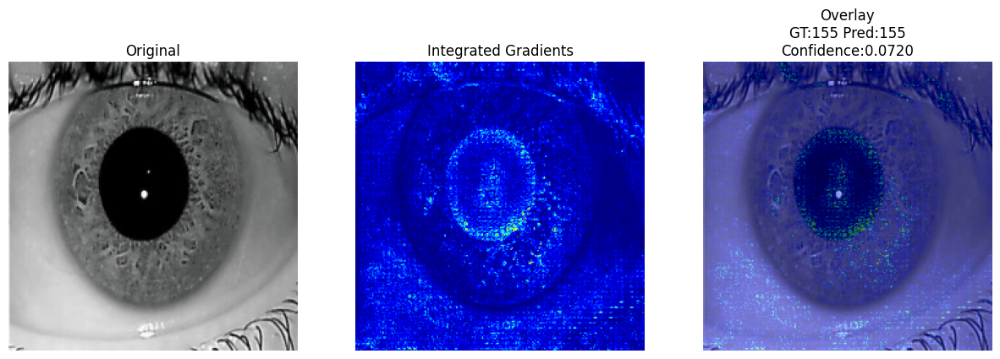

In [37]:
for i in range(5):
    sample = medium_conf.iloc[i]

    result = generate_integrated_gradients(
        sample_info=sample,
        model=wrapper,
        transform=iris_test_transform ,
        device=device,
        explain="prediction"
    )

    fig = plot_integrated_gradients(result)
    plt.show()

/tmp/ipykernel_58/4223881066.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  alpha * plt.cm.get_cmap(cmap)(heatmap)[...,:3]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.000000011920929].


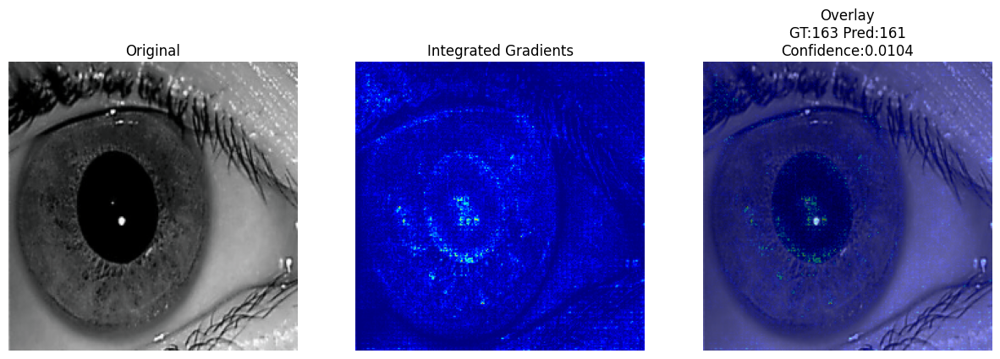

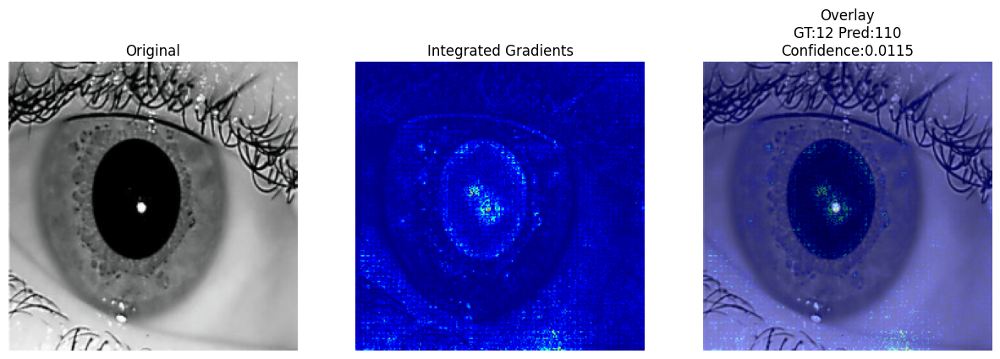

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.000000011920929].


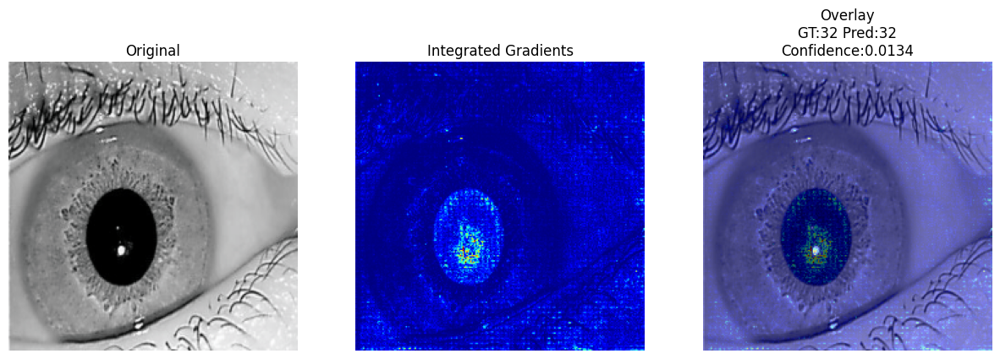

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.000000011920929].


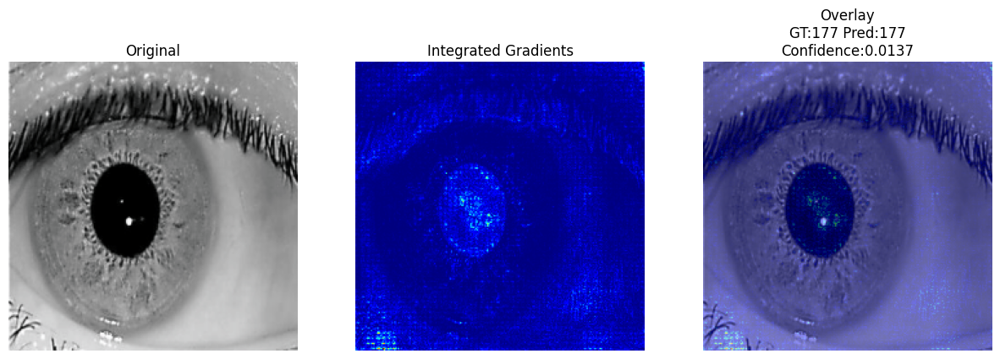

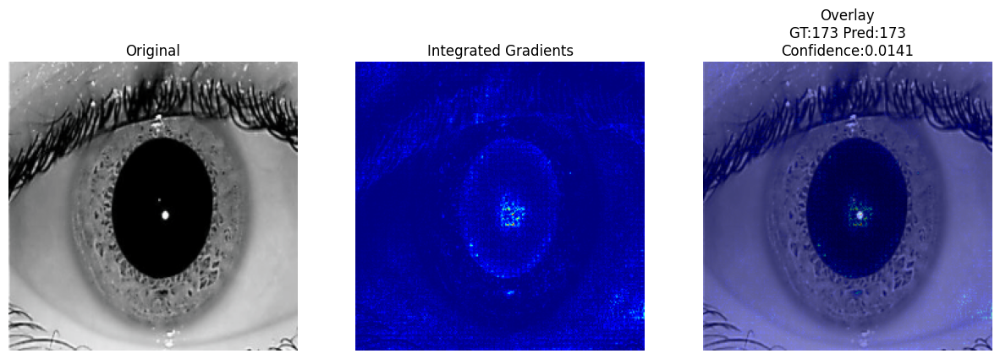

In [38]:
for i in range(5):
    sample = low_conf.iloc[i]

    result = generate_integrated_gradients(
        sample_info=sample,
        model=wrapper,
        transform=iris_test_transform ,
        device=device,
        explain="prediction"
    )

    fig = plot_integrated_gradients(result)
    plt.show()

In [39]:
wrong_pred = results_df[
    results_df["correct"] == False
]

print("Wrong Predictions :", len(wrong_pred))

wrong_pred.head()

Wrong Predictions : 3


,path,ground_truth,prediction,confidence,correct
24,/kaggle/input/datasets/subihanbiswas/iitd-iris...,12,110,0.011470,False
234,/kaggle/input/datasets/subihanbiswas/iitd-iris...,117,6,0.028678,False
326,/kaggle/input/datasets/subihanbiswas/iitd-iris...,163,161,0.010445,False


Wrong Prediction 1


/tmp/ipykernel_58/4223881066.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  alpha * plt.cm.get_cmap(cmap)(heatmap)[...,:3]


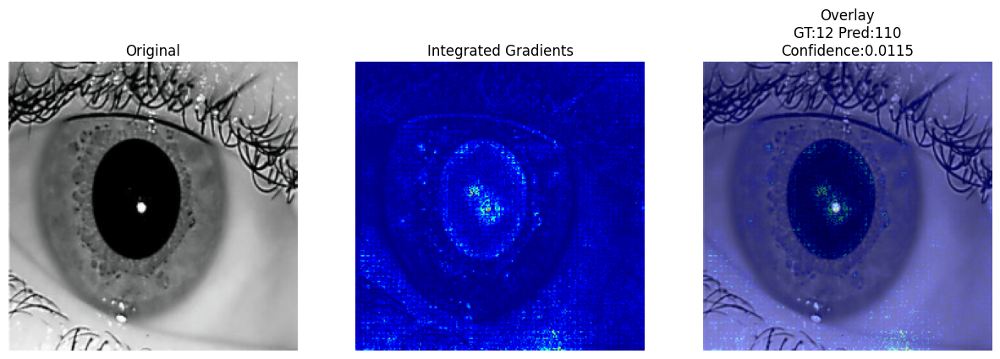

Wrong Prediction 2


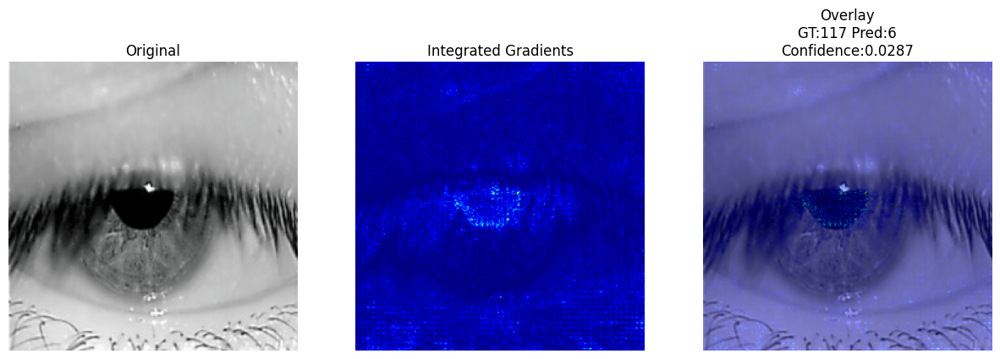

Wrong Prediction 3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.000000011920929].


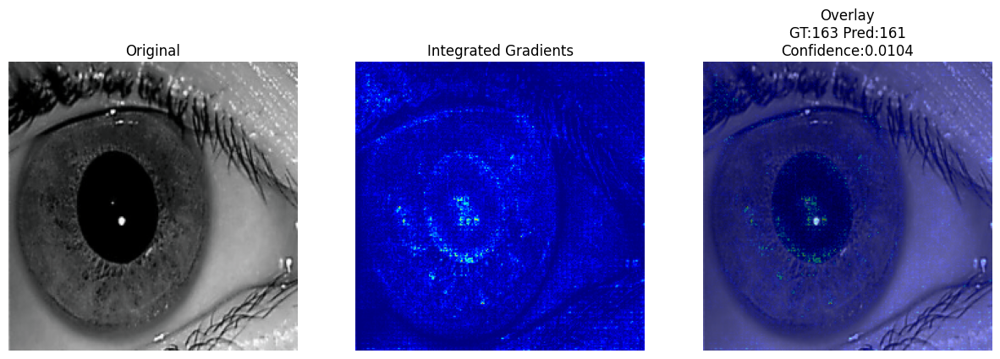

In [40]:
for i in range(min(5, len(wrong_pred))):

    sample = wrong_pred.iloc[i]

    print("=" * 80)
    print(f"Wrong Prediction {i+1}")

    result = generate_integrated_gradients(

        sample_info=sample,

        model=wrapper,

        transform=iris_test_transform,

        device=device,

        explain="prediction",

        n_steps=50

    )

    fig = plot_integrated_gradients(result)

    plt.show()